<div class="alert alert-block alert-info">
<b>Note:</b> The goal of this notebook is to show you how to work with the Bayesian Statistics Toolbox (BST) when performing an analysis that involves comparing the effect of a nominal predictor on a metric outcome (think ANOVA) that may be normally or non-normally distributed (the "robust" version). There is also the Bayesian analogue of an ANCOVA (categorical and metric predictors). These models utilize multi-level (hierarchical) modeling, one of the great strengths of Bayesian modeling. This is an adaptation of Jordi Warmenhoven's PyMC3 port of Chapter 19 of John Kruschke's textbook "Doing Bayesian Data Analysis: A Tutorial with R, JAGS, and Stan" (https://github.com/JWarmenhoven/DBDA-python). Please note that the code has been updated to make use of PyMC4 and that this does not (yet) include all of the examples from the original. </div>

In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import seaborn as sns
import xarray as xr

# Import BST
import src.bayesian_stats as bst

from IPython.display import Image

print(f"Running on PyMC v{pm.__version__}")

Running on PyMC v4.3.0


In [2]:
%config InlineBackend.figure_format = 'retina'
az.style.use("arviz-darkgrid")
az.rcParams["stats.hdi_prob"] = 0.95

In [3]:
df = pd.read_csv('data/FruitflyDataReduced.csv', dtype={'CompanionNumber':'category'})
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125 entries, 0 to 124
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   Longevity        125 non-null    int64   
 1   CompanionNumber  125 non-null    category
 2   Thorax           125 non-null    float64 
dtypes: category(1), float64(1), int64(1)
memory usage: 2.4 KB


In [4]:
df.groupby('CompanionNumber').head(2)

,Longevity,CompanionNumber,Thorax
0,35,Pregnant8,0.64
1,37,Pregnant8,0.68
25,40,None0,0.64
26,37,None0,0.70
50,46,Pregnant1,0.64
51,42,Pregnant1,0.68
75,21,Virgin1,0.68
76,40,Virgin1,0.68
100,16,Virgin8,0.64
101,19,Virgin8,0.64


In [5]:
# Count the number of records per nominal group
df.CompanionNumber.value_counts()

None0        25
Pregnant1    25
Pregnant8    25
Virgin1      25
Virgin8      25
Name: CompanionNumber, dtype: int64

### Kruschke-style graphical model

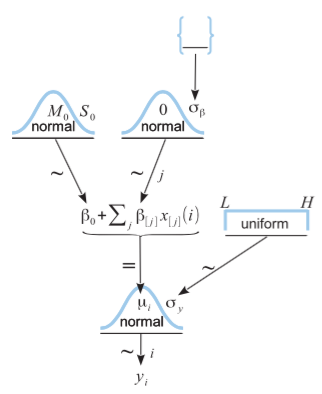

In [6]:
Image('images/fig19_2.png')

In [7]:
x = df.CompanionNumber
y = df.Longevity

# Fit your statistical model
model, idata = bst.hierarchical_bayesian_anova(x, y, n_draws=3000, acceptance_rate=0.95)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma_a, a0, a, sigma_y]


Sampling 4 chains for 1_000 tune and 3_000 draw iterations (4_000 + 12_000 draws total) took 44 seconds.


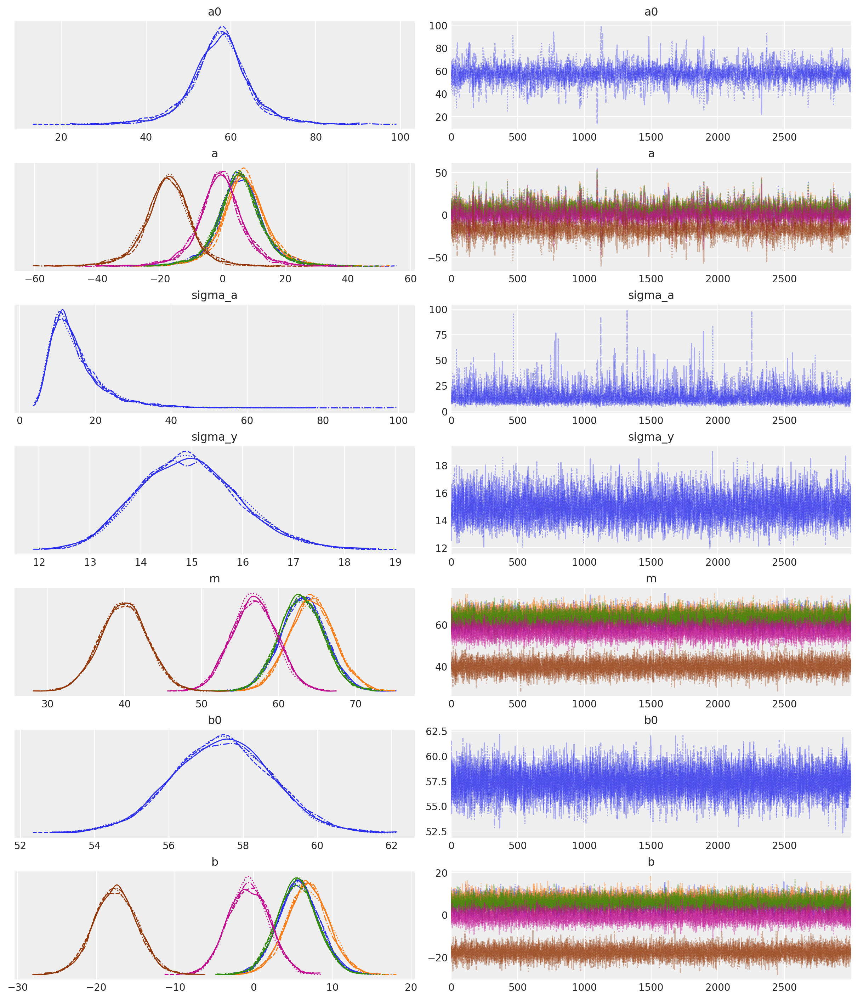

In [8]:
# Plot marginal posteriors and check the health of your chains
az.plot_trace(idata);

In [9]:
# Stack your chains
post = az.extract(idata.posterior)
post

<xarray.Dataset>
Dimensions:  (sample: 12000, groups: 5, m_dim_0: 5, b_dim_0: 5)
Coordinates:
  * groups   (groups) <U9 'None0' 'Pregnant1' 'Pregnant8' 'Virgin1' 'Virgin8'
  * m_dim_0  (m_dim_0) int64 0 1 2 3 4
  * b_dim_0  (b_dim_0) int64 0 1 2 3 4
  * sample   (sample) object MultiIndex
  * chain    (sample) int64 0 0 0 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3 3 3 3 3
  * draw     (sample) int64 0 1 2 3 4 5 6 ... 2993 2994 2995 2996 2997 2998 2999
Data variables:
    a0       (sample) float64 55.6 55.28 54.3 57.61 ... 51.75 55.24 60.88 62.58
    a        (groups, sample) float64 9.636 9.183 11.25 ... -15.76 -21.4 -19.41
    sigma_a  (sample) float64 9.257 13.64 14.89 12.06 ... 8.058 10.43 10.58
    sigma_y  (sample) float64 14.48 14.56 14.42 14.36 ... 15.8 14.93 14.49 15.22
    m        (m_dim_0, sample) float64 65.24 64.46 65.55 ... 39.48 39.49 43.17
    b0       (sample) float64 59.45 57.52 56.71 55.66 ... 57.79 57.2 58.62 58.68
    b        (b_dim_0, sample) float64 5.782 6.939 8.835 ... -19.13 -15.51
Attributes:
    created_at:                 2022-11-20T18:43:48.050075
    arviz_version:              0.13.0
    inference_library:          pymc
    inference_library_version:  4.3.0
    sampling_time:              43.93199682235718
    tuning_steps:               1000

### Contrasts

Below, I'm taking advantage of the label-based indexing functionality afforded by Xarray.dataset objects. See [here](https://docs.xarray.dev/en/stable/getting-started-guide/quick-overview.html) for a quick overview on working with the xarray library. 

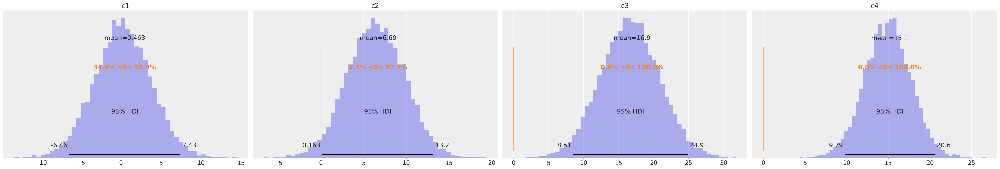

In [10]:
contrasts = dict(c1=(post.a.sel(groups=["Pregnant1", "Pregnant8"]).mean(axis=0) - post.a.sel(groups="None0")).values,
             c2=(post.a.sel(groups=["Pregnant1", "Pregnant8", "None0"]).mean(axis=0) - post.a.sel(groups="Virgin1")).values,
             c3=(post.a.sel(groups=["Virgin1"]).values - post.a.sel(groups=["Virgin8"]).values).flatten(),
             c4=(post.a.sel(groups=["Pregnant1", "Pregnant8", "None0"]).mean(axis=0) - 
                 post.a.sel(groups=["Virgin1", "Virgin8"]).mean(axis=0)).values)

az.plot_posterior(contrasts, kind="hist", round_to=3, ref_val=0, bins=50);

## Bayesian "ANCOVA"

### Kruschke-style graphical model

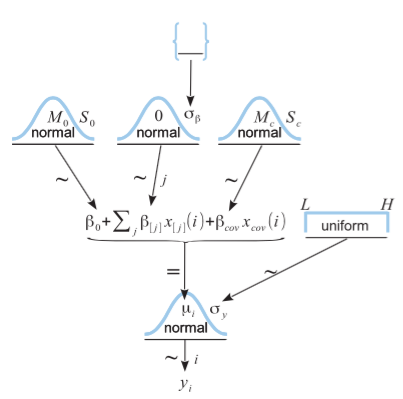

In [11]:
Image('images/fig19_4.png')

In [12]:
y = df.Longevity
mu_y = y.mean()
sigma_y = y.std()
x_nom = df.CompanionNumber
x_met = df.Thorax
mu_x_met = x_met.mean()
sigma_x_met = x_met.std()

In [13]:
model2, idata2 = bst.hierarchical_bayesian_ancova(x, x_met, y, mu_x_met, mu_y, sigma_x_met, sigma_y)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma_a, a0, a, a_met, sigma_y]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 28 seconds.


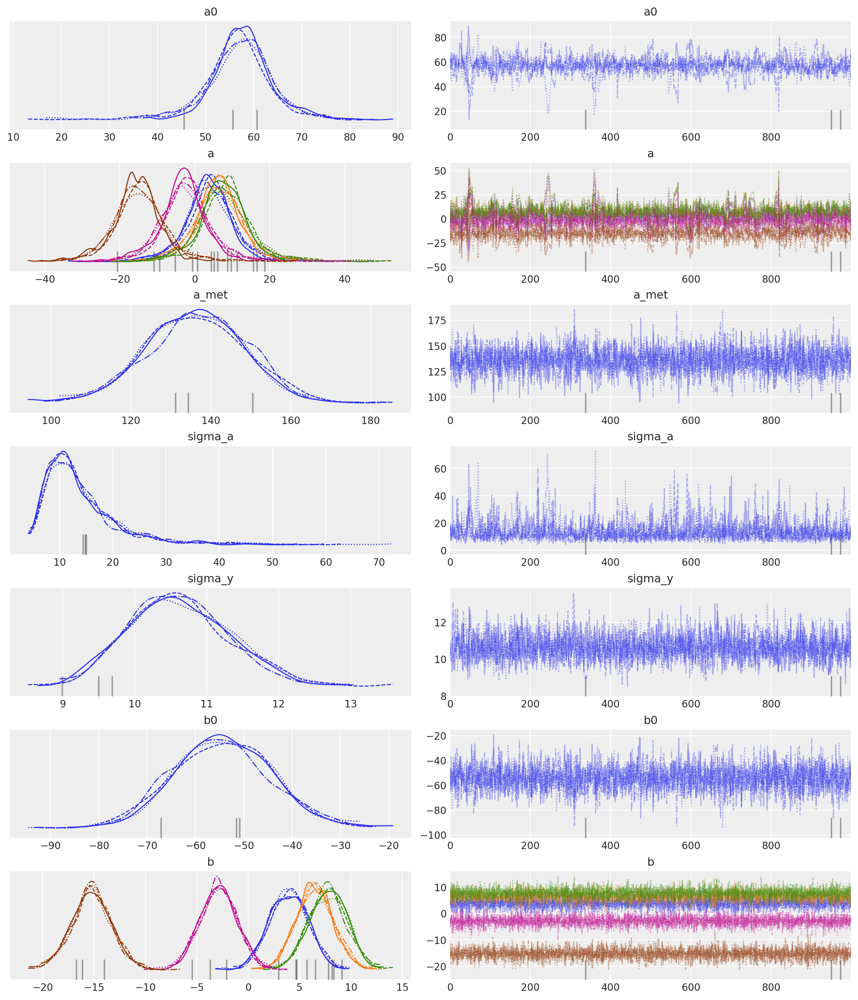

In [14]:
# Plot marginal posteriors and check the health of your chains
az.plot_trace(idata2);

In [15]:
post2 = az.extract(idata2.posterior)
contrasts2 = {"Pregnant1Pregnant8 vs None0": 
              (post2.a.sel(groups=["Pregnant1", "Pregnant8"]).mean(axis=0) - post2.a.sel(groups="None0")).values,
              "Pregnant1Pregnant8None0 vs Virgin1":
              (post2.a.sel(groups=["Pregnant1", "Pregnant8", "None0"]).mean(axis=0) - post2.a.sel(groups="Virgin1")).values,
             "Virgin1 vs Virgin8":
              (post2.a.sel(groups=["Virgin1"]).values - post2.a.sel(groups=["Virgin8"]).values).flatten()}

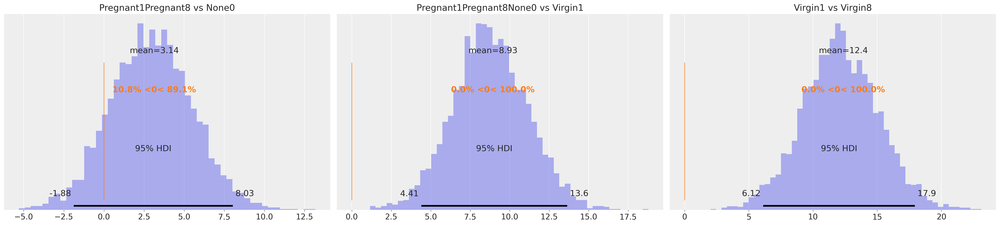

In [16]:
az.plot_posterior(contrasts2, kind="hist", bins=50, round_to=3, ref_val=0);

### Robust ANOVA with Heterogeneous Variances 

In [17]:
df2 = pd.read_csv('data/NonhomogVarData.csv')  # Not including the dtype argument to make sure BST function works
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Group   96 non-null     object 
 1   Y       96 non-null     float64
dtypes: float64(1), object(1)
memory usage: 1.6+ KB


In [18]:
df2.groupby('Group').head(3)

,Group,Y
0,A,97.770214
1,A,99.919872
2,A,92.372917
24,B,98.246778
25,B,98.736006
26,B,98.722708
48,C,102.432580
49,C,102.198665
50,C,103.052658
72,D,97.561346


### Kruschke-style graphical model

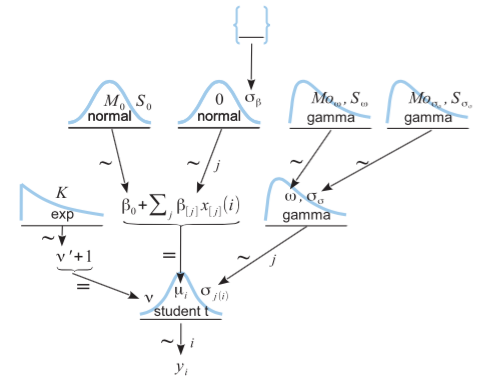

In [19]:
Image('images/fig19_6.png')

In [20]:
y = df2.Y
x = df2.Group
mu_y = y.mean()
sigma_y = y.std()

In [21]:
model3, idata3 = bst.robust_bayesian_anova(x, y, mu_y, sigma_y, n_draws=2000, acceptance_rate=0.95)

Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...


Convergence achieved at 28500
Interrupted at 28,499 [14%]: Average Loss = 29,628
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma_a, a0, a, sigma_y_sd, sigma_y_mode, sigma, nu_minus1]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 131 seconds.


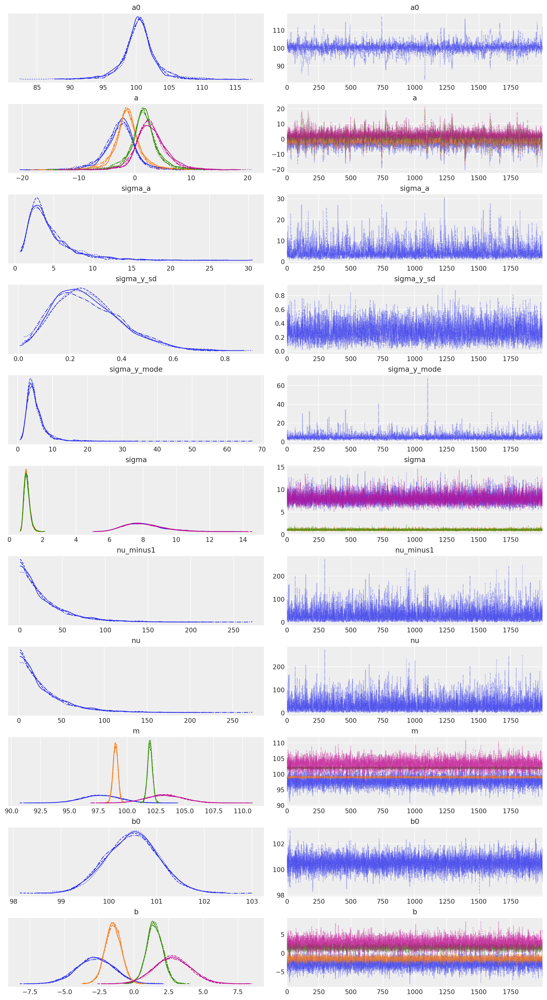

In [22]:
az.plot_trace(idata3);